<a href="https://colab.research.google.com/github/Parinita-Jain/Applied_CV_using_DL/blob/main/12_5_Detecting_Single_Face_using_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Objective

The objective of the notebook is to build a face detection system that can detect single face from images.

![alt text](https://drive.google.com/uc?export=view&id=13zzmdQBU3W0yyS2DSinQpPE9PRDQeMKI)



# Steps to solve the Face Detection problem

1. Install Dependencies
2. Loading and pre-processing the data
3. Creating annotations as per Detectron2
4. Register the dataset
5. Fine Tuning the model
6. Evaluating model performance

##1. Install Dependencies

In [1]:
!python -m pip install pyyaml==5.1
# Detectron2 has not released pre-built binaries for the latest pytorch (https://github.com/facebookresearch/detectron2/issues/4053)
# so we install from source instead. This takes a few minutes.
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

# Install pre-built detectron2 that matches pytorch version, if released:
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
#!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/{CUDA_VERSION}/{TORCH_VERSION}/index.html

# exit(0)  # After installation, you may need to "restart runtime" in Colab. This line can also restart runtime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 KB 3.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyyaml: filename=PyYAML-5.1-cp38-cp38-linux_x86_64.whl size=44089 sha256=948fc4b85a3aa47707c84057e7cfae35fb6dada8a4f849a6f4c99a4ca99019c0
  Stored in directory: /root/.cache/pip/wheels/52/dd/2b/10ff8b0ac81b93946bb5fb9e6749bae2dac246506c8774e6cf
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0
    Uninstalling PyYAML-6.0:
      Successfully uninstalled PyYAML-6.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask 2022.2.1 requires pyyaml>=5.3.1, but you have pyyaml 5.1 which is incompatible.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheel

In [2]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2021 NVIDIA Corporation
Built on Sun_Feb_14_21:12:58_PST_2021
Cuda compilation tools, release 11.2, V11.2.152
Build cuda_11.2.r11.2/compiler.29618528_0
torch:  1.13 ; cuda:  cu116
detectron2: 0.6


##2. Loading and pre-processing the data

In [3]:
# mounting drive
from google.colab import drive
drive.mount('drive')

Mounted at drive


In [4]:
# extracting files
!unzip '/content/drive/MyDrive/Wider_faces/WIDER_train.zip'
!unzip '/content/drive/MyDrive/Wider_faces/WIDER_val.zip'
!unzip '/content/drive/MyDrive/Wider_faces/wider_face_split.zip'

Streaming output truncated to the last 5000 lines.
  inflating: WIDER_train/images/55--Sports_Coach_Trainer/55_Sports_Coach_Trainer_sportcoaching_55_498.jpg  
  inflating: WIDER_train/images/55--Sports_Coach_Trainer/55_Sports_Coach_Trainer_sportcoaching_55_501.jpg  
  inflating: WIDER_train/images/55--Sports_Coach_Trainer/55_Sports_Coach_Trainer_sportcoaching_55_504.jpg  
  inflating: WIDER_train/images/55--Sports_Coach_Trainer/55_Sports_Coach_Trainer_sportcoaching_55_507.jpg  
  inflating: WIDER_train/images/55--Sports_Coach_Trainer/55_Sports_Coach_Trainer_sportcoaching_55_509.jpg  
  inflating: WIDER_train/images/55--Sports_Coach_Trainer/55_Sports_Coach_Trainer_sportcoaching_55_518.jpg  
  inflating: WIDER_train/images/55--Sports_Coach_Trainer/55_Sports_Coach_Trainer_sportcoaching_55_529.jpg  
  inflating: WIDER_train/images/55--Sports_Coach_Trainer/55_Sports_Coach_Trainer_sportcoaching_55_533.jpg  
  inflating: WIDER_train/images/55--Sports_Coach_Trainer/55_Sports_Coach_Trainer_spor

In [5]:
# reading files
import pandas as pd

# specify path of the data

path_train = '/content/wider_face_split/wider_face_train_bbx_gt.txt'
path_val = '/content/wider_face_split/wider_face_val_bbx_gt.txt'

# reading data
train = pd.read_csv(path_train,header=None)
val = pd.read_csv(path_val,header=None)

In [6]:
# first 10 rows
train.head(10)

,0
0,0--Parade/0_Parade_marchingband_1_849.jpg
1,1
2,449 330 122 149 0 0 0 0 0 0
3,0--Parade/0_Parade_Parade_0_904.jpg
4,1
5,361 98 263 339 0 0 0 0 0 0
6,0--Parade/0_Parade_marchingband_1_799.jpg
7,21
8,78 221 7 8 2 0 0 0 0 0
9,78 238 14 17 2 0 0 0 0 0


![alt text](https://drive.google.com/uc?export=view&id=1WN_V0rOz_vLSV6JK-oWHamUxjXUZ-0Wp)

We will reformat the dataframe in the form of image name, num of faces, list of bounding boxes. Lets define the function for the same task

In [7]:
# pre-processing data
# this function accepts the dataframe and returns modified dataframe
def reformat(df):
  
  # fetch values of first column
  values = df[0].values

  # creating empty lists
  names=[]
  num_faces=[]
  bbox=[]

  # fetch values into corresponding lists
  for i in range(len(values)):
      
      # if an image
      if ".jpg" in values[i]:
        
        # no. of faces
        num=int(values[i+1])
        
        # append image name to list
        names.append(values[i])
        
        # append no. of faces to list
        num_faces.append(num)
        
        # create bbox list
        box=[]
        for j in range(i+2,i+2+num):
          box.append(values[j])
        
        # append bbox list to list
        bbox.append(box)
  
  return pd.DataFrame({'name':names,'num_faces':num_faces,'bbox':bbox})

In [8]:
# pre-processing the data 
train = reformat(train)
val = reformat(val)

In [9]:
# first 5 rows of the pre-processed data
train.head()

,name,num_faces,bbox
0,0--Parade/0_Parade_marchingband_1_849.jpg,1,[449 330 122 149 0 0 0 0 0 0 ]
1,0--Parade/0_Parade_Parade_0_904.jpg,1,[361 98 263 339 0 0 0 0 0 0 ]
2,0--Parade/0_Parade_marchingband_1_799.jpg,21,"[78 221 7 8 2 0 0 0 0 0 , 78 238 14 17 2 0 0 0..."
3,0--Parade/0_Parade_marchingband_1_117.jpg,9,"[69 359 50 36 1 0 0 0 0 1 , 227 382 56 43 1 0 ..."
4,0--Parade/0_Parade_marchingband_1_778.jpg,35,"[27 226 33 36 1 0 0 0 2 0 , 63 95 16 19 2 0 0 ..."


In [10]:
# shape of the training data
train.shape

(12880, 3)

In [11]:
# shape of validation data
val.shape

(3226, 3)

In [12]:
# adding full path
train['name'] = train['name'].apply(lambda x: 'WIDER_train/images/'+x )
val['name']   = val['name'].apply(lambda x: 'WIDER_val/images/'+x )

In [13]:
# first 5 rows
train.head()

,name,num_faces,bbox
0,WIDER_train/images/0--Parade/0_Parade_marching...,1,[449 330 122 149 0 0 0 0 0 0 ]
1,WIDER_train/images/0--Parade/0_Parade_Parade_0...,1,[361 98 263 339 0 0 0 0 0 0 ]
2,WIDER_train/images/0--Parade/0_Parade_marching...,21,"[78 221 7 8 2 0 0 0 0 0 , 78 238 14 17 2 0 0 0..."
3,WIDER_train/images/0--Parade/0_Parade_marching...,9,"[69 359 50 36 1 0 0 0 0 1 , 227 382 56 43 1 0 ..."
4,WIDER_train/images/0--Parade/0_Parade_marching...,35,"[27 226 33 36 1 0 0 0 2 0 , 63 95 16 19 2 0 0 ..."


In [14]:
# converting bbox to floating point
import numpy as np
train['bbox'] = train['bbox'].apply(lambda row:[ np.float_(annos.split()) for annos in row] )
val['bbox']   = val['bbox'].apply(lambda row:[ np.float_(annos.split()) for annos in row] )

In [15]:
# first 5 rows
train.head()

,name,num_faces,bbox
0,WIDER_train/images/0--Parade/0_Parade_marching...,1,"[[449.0, 330.0, 122.0, 149.0, 0.0, 0.0, 0.0, 0..."
1,WIDER_train/images/0--Parade/0_Parade_Parade_0...,1,"[[361.0, 98.0, 263.0, 339.0, 0.0, 0.0, 0.0, 0...."
2,WIDER_train/images/0--Parade/0_Parade_marching...,21,"[[78.0, 221.0, 7.0, 8.0, 2.0, 0.0, 0.0, 0.0, 0..."
3,WIDER_train/images/0--Parade/0_Parade_marching...,9,"[[69.0, 359.0, 50.0, 36.0, 1.0, 0.0, 0.0, 0.0,..."
4,WIDER_train/images/0--Parade/0_Parade_marching...,35,"[[27.0, 226.0, 33.0, 36.0, 1.0, 0.0, 0.0, 0.0,..."


In [16]:
# extracting class names
train['class']= train['name'].apply(lambda x:x.split("/")[2].split("--")[1])
val['class']  = val['name'].apply(lambda x:x.split("/")[2].split("--")[1])

In [17]:
# first 5 rows
train.head()

,name,num_faces,bbox,class
0,WIDER_train/images/0--Parade/0_Parade_marching...,1,"[[449.0, 330.0, 122.0, 149.0, 0.0, 0.0, 0.0, 0...",Parade
1,WIDER_train/images/0--Parade/0_Parade_Parade_0...,1,"[[361.0, 98.0, 263.0, 339.0, 0.0, 0.0, 0.0, 0....",Parade
2,WIDER_train/images/0--Parade/0_Parade_marching...,21,"[[78.0, 221.0, 7.0, 8.0, 2.0, 0.0, 0.0, 0.0, 0...",Parade
3,WIDER_train/images/0--Parade/0_Parade_marching...,9,"[[69.0, 359.0, 50.0, 36.0, 1.0, 0.0, 0.0, 0.0,...",Parade
4,WIDER_train/images/0--Parade/0_Parade_marching...,35,"[[27.0, 226.0, 33.0, 36.0, 1.0, 0.0, 0.0, 0.0,...",Parade


In [20]:
# reading class names
easy_df = pd.read_csv('/content/drive/MyDrive/Wider_faces/easy.txt',header=None)
easy_labels = easy_df[0].values

In [21]:
# easy labels
easy_labels

array(['Gymnastics', 'Handshaking', 'Waiter Waitress', 'Press Conference',
       'Worker Laborer', 'Parachutist Paratrooper',
       'Sports Coach Trainer', 'Meeting', 'Aerobics', 'Row Boat',
       'Dancing', 'Swimming', 'Family Group', 'Balloonist', 'Dresses',
       'Couple', 'Jockey', 'Tennis', 'Spa', 'Surgeons'], dtype=object)

In [22]:
# creating empty dataframes
train_df, val_df= pd.DataFrame(), pd.DataFrame()

# fetching rows of easy classes only
for i in easy_labels:
  train_df = pd.concat( [train_df, train[train['class']==i]] )
  val_df   = pd.concat( [val_df, val[val['class']==i]] )

In [23]:
# fetch images of single faces only
train_df= train_df[train_df['num_faces']==1].reset_index(drop=True)
val_df  = val_df[val_df['num_faces']==1].reset_index(drop=True)

In [24]:
# shape of dataframe
train_df.shape, val_df.shape

((1081, 4), (274, 4))

## 3. Creating annotations as per Detectron2

We will see how to convert the annotations of wider dataset to the annotations of Detectron2

In [25]:
# custom annotation format
idx=0
values = train_df.values[idx]
print(values)

['WIDER_train/images/40--Gymnastics/40_Gymnastics_Gymnastics_40_785.jpg' 1
 list([array([480., 212., 102., 120.,   0.,   0.,   0.,   0.,   0.,   0.])])
 'Gymnastics']


![alt text](https://drive.google.com/uc?export=view&id=1AxlMNsub4dt7ARohSlF6mWX7fZmSVmqF)

In [26]:
# for dealing with images
import cv2

# create annotation dict 
record = {}

# image name        
filename = values[0]

# height and width of an image
height, width = cv2.imread(filename).shape[:2]

# creating fields    
record["file_name"] = filename
record["image_id"] = 0
record["height"] = height
record["width"] = width

In [27]:
# different ways to represent bounding box
from detectron2.structures import BoxMode

# create bbox list
objs = []
  
# for every face in an image
for i in range(len(values[2])):
  
  # fetch bbox coordinates
  annos = values[2][i]

  # unpack values
  x1, y1, w, h = annos[0], annos[1], annos[2], annos[3]
  
  # find bottom right corner
  x2, y2 = x1 + w, y1 + h
  
  # create bbox dict
  obj = {       "bbox": [x1, y1, x2, y2],
                "bbox_mode": BoxMode.XYXY_ABS,
                "category_id": 0,  
                "iscrowd": 0
        }

  # append bbox dict to bbox list
  objs.append(obj)

In [28]:
# assigning bbox list to annotation dict
record["annotations"] = objs

In [29]:
# standard annotation format
record

{'file_name': 'WIDER_train/images/40--Gymnastics/40_Gymnastics_Gymnastics_40_785.jpg',
 'image_id': 0,
 'height': 683,
 'width': 1024,
 'annotations': [{'bbox': [480.0, 212.0, 582.0, 332.0],
   'bbox_mode': <BoxMode.XYXY_ABS: 0>,
   'category_id': 0,
   'iscrowd': 0}]}

In [30]:
def create_annotation(df):  
  
  # create list to store annotation dict
  dataset_dicts = []

  # for each image 
  for idx, v in enumerate(df.values):
    
    # create annotation dict 
    record = {}

    # image name        
    filename = v[0]

    # height and width of an image
    height, width = cv2.imread(filename).shape[:2]

    # assign values to fields    
    record["file_name"] = filename
    record["image_id"] = idx
    record["height"] = height
    record["width"] = width

    # create list for bbox
    objs = []
    for i in range(len(v[2])):

      # bounding box coordinates
      annos = v[2][i]
      
      # unpack values
      x1, y1, w, h = annos[0], annos[1], annos[2], annos[3]
      
      # find bottom right corner
      x2, y2 = x1 + w, y1 + h
      
      # create bbox dict
      obj = {   "bbox": [x1, y1, x2, y2],
                "bbox_mode": BoxMode.XYXY_ABS,
                "category_id": 0,
                "iscrowd": 0
            }

      # append bbox dict to a bbox list      
      objs.append(obj)
    
    # assign bbox list to annotation dict
    record["annotations"] = objs

    # append annotation dict to list
    dataset_dicts.append(record)
  
  return dataset_dicts

In [31]:
# create standard annotations for training and validation datasets
train_annotation = create_annotation(train_df)
val_annotation = create_annotation(val_df)

In [32]:
# standard annotation of an image
train_annotation[0]

{'file_name': 'WIDER_train/images/40--Gymnastics/40_Gymnastics_Gymnastics_40_785.jpg',
 'image_id': 0,
 'height': 683,
 'width': 1024,
 'annotations': [{'bbox': [480.0, 212.0, 582.0, 332.0],
   'bbox_mode': <BoxMode.XYXY_ABS: 0>,
   'category_id': 0,
   'iscrowd': 0}]}

##4. Register the dataset

To let detectron2 know how to obtain a dataset, we will implement a function that returns the items in your dataset and then tell detectron2 about this function. For this, we will follow these steps:

1. Register your dataset (i.e., tell detectron2 how to obtain your dataset).

2. Optionally, register metadata for your dataset.

In [33]:
from detectron2.data import DatasetCatalog, MetadataCatalog

# register dataset
DatasetCatalog.register("face_train", lambda d="train": create_annotation(train_df))

In [34]:
# register metadata
MetadataCatalog.get("face_train").set(thing_classes=["face"])

Metadata(name='face_train', thing_classes=['face'])

In [35]:
# for drawing bounding boxes on images
from detectron2.utils.visualizer import Visualizer

# for displaying an image
from google.colab.patches import cv2_imshow

# for randomly selecting images
import random

# get the name of the classes
face_metadata = MetadataCatalog.get("face_train")

print(face_metadata)

Metadata(name='face_train', thing_classes=['face'])


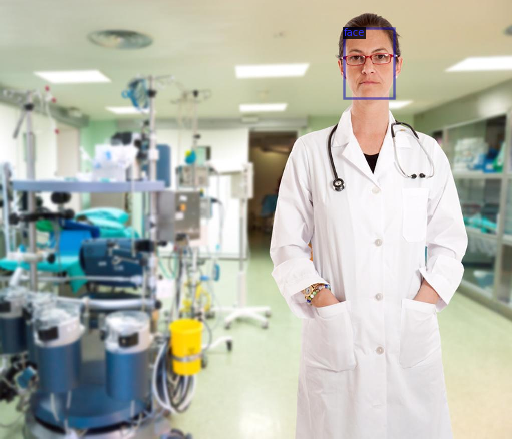

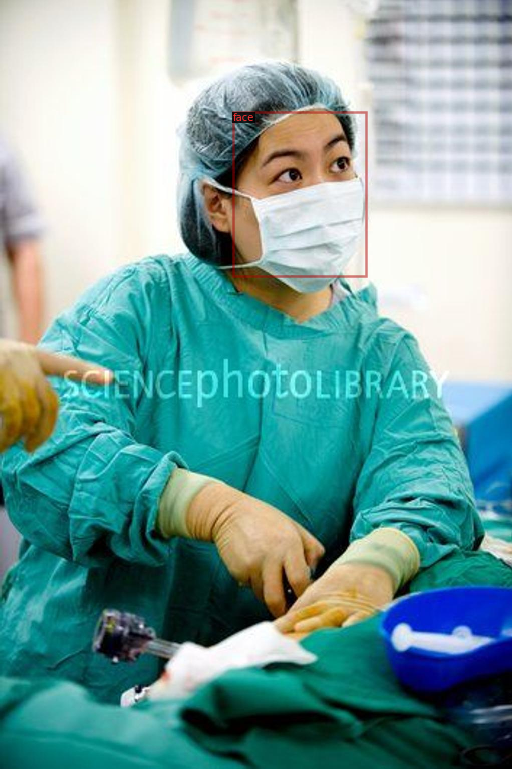

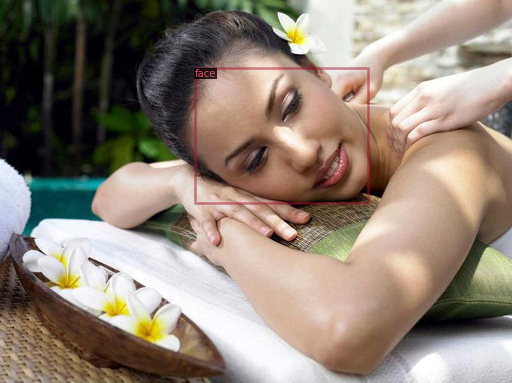

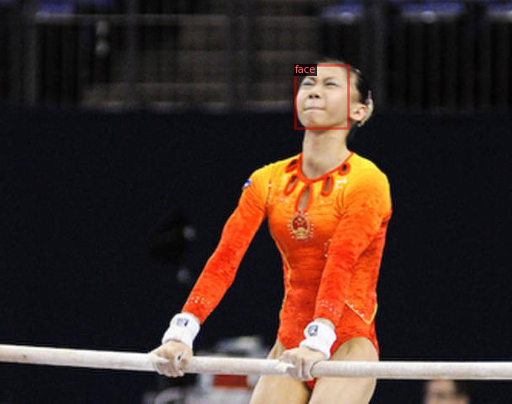

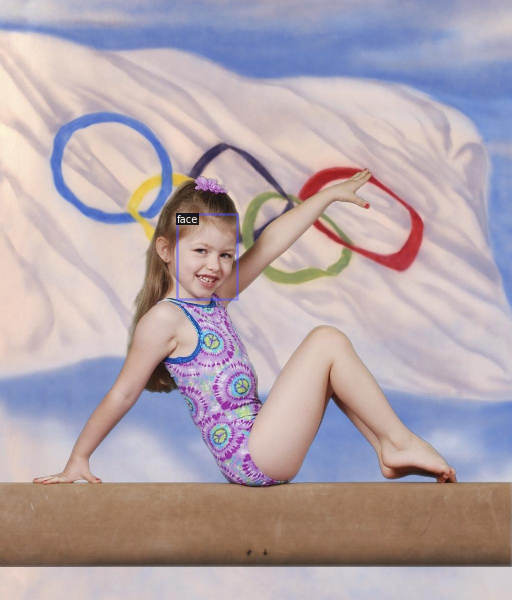

In [36]:
# randomly select images
for d in random.sample(train_annotation, 5):
  
  # read an image
  img = cv2.imread(d["file_name"])

  # create visualizer
  visualizer = Visualizer(img[:, :, ::-1], metadata=face_metadata, scale=0.5)
  
  # draw bounding box on image
  vis = visualizer.draw_dataset_dict(d)
  
  # display an image
  cv2_imshow(vis.get_image()[:, :, ::-1])

## 5. Fine Tuning the model

In [37]:
# to obtain pretrained models
from detectron2 import model_zoo

# to train the model
from detectron2.engine import DefaultTrainer

# set up the config
from detectron2.config import get_cfg

# interact with os
import os

# define configure instance
cfg = get_cfg()

# Get a model specified by relative path under Detectron2’s official configs/ directory.
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_50_FPN_1x.yaml"))

# load pretrained weights
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/retinanet_R_50_FPN_1x.yaml")  

In [38]:
# List of the dataset names for training. Must be registered in DatasetCatalog
cfg.DATASETS.TRAIN = ("face_train",)

cfg.DATASETS.TEST = ()

In [39]:
# no. of images per batch
cfg.SOLVER.IMS_PER_BATCH = 2

# set base learning rate
cfg.SOLVER.BASE_LR = 0.001  

# no. of iterations 
cfg.SOLVER.MAX_ITER = 1000

# only has one class (face)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  

In [40]:
# create directory to save weights
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

# create a trainer with given config
trainer = DefaultTrainer(cfg) 

# If resume==True, and last checkpoint exists, resume from it, load all checkpointables (eg. optimizer and scheduler) and update iteration counter.
# Otherwise, load the model specified by the config (skip all checkpointables) and start from the first iteration.
trainer.resume_or_load(resume=False)

# train the model
trainer.train()

[02/02 15:04:02 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res2)

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[02/02 15:04:17 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-Detection/retinanet_R_50_FPN_1x/190397773/model_final_bfca0b.pkl ...


model_final_bfca0b.pkl: 152MB [00:08, 18.7MB/s]                           
  pixel_mean
  pixel_std


[02/02 15:04:27 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.8/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[02/02 15:04:46 d2.utils.events]:  eta: 0:08:03  iter: 19  total_loss: 2.067  loss_cls: 1.499  loss_box_reg: 0.6115  time: 0.5843  data_time: 0.0385  lr: 1.9981e-05  max_mem: 3560M
[02/02 15:04:57 d2.utils.events]:  eta: 0:08:05  iter: 39  total_loss: 1.688  loss_cls: 1.028  loss_box_reg: 0.6211  time: 0.5494  data_time: 0.0142  lr: 3.9961e-05  max_mem: 3560M
[02/02 15:05:07 d2.utils.events]:  eta: 0:07:57  iter: 59  total_loss: 1.356  loss_cls: 0.8131  loss_box_reg: 0.6185  time: 0.5387  data_time: 0.0122  lr: 5.9941e-05  max_mem: 3566M
[02/02 15:05:17 d2.utils.events]:  eta: 0:07:42  iter: 79  total_loss: 1.102  loss_cls: 0.5869  loss_box_reg: 0.5061  time: 0.5308  data_time: 0.0122  lr: 7.9921e-05  max_mem: 3566M
[02/02 15:05:28 d2.utils.events]:  eta: 0:07:41  iter: 99  total_loss: 0.8841  loss_cls: 0.4392  loss_box_reg: 0.4297  time: 0.5351  data_time: 0.0109  lr: 9.9901e-05  max_mem: 3566M
[02/02 15:05:39 d2.utils.events]:  eta: 0:07:35  iter: 119  total_loss: 0.7334  loss_cls: 0

In [41]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

## 6. Evaluating model performance

In [42]:
# register validation dataset
DatasetCatalog.register("face_val", lambda d="val": create_annotation(val_df))

# register metadata
MetadataCatalog.get("face_val").set(thing_classes=["face"])

Metadata(name='face_val', thing_classes=['face'])

In [43]:
# load the final weights
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")

# set the testing threshold for this model
cfg.MODEL.RETINANET.SCORE_THRESH_TEST = 0.8

# List of the dataset names for validation. Must be registered in DatasetCatalog
cfg.DATASETS.TEST = ("face_val", )

In [44]:
# set up predictor
from detectron2.engine import DefaultPredictor

# Create a simple end-to-end predictor with the given config that runs on single device for a single input image.
predictor = DefaultPredictor(cfg)

[02/02 15:13:45 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


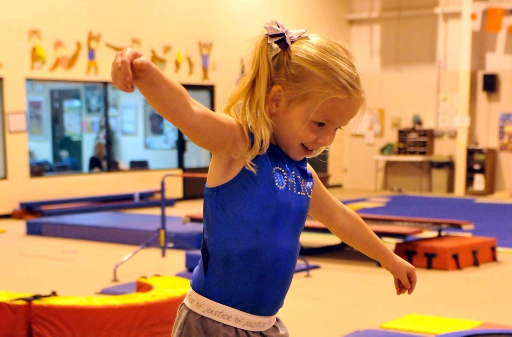

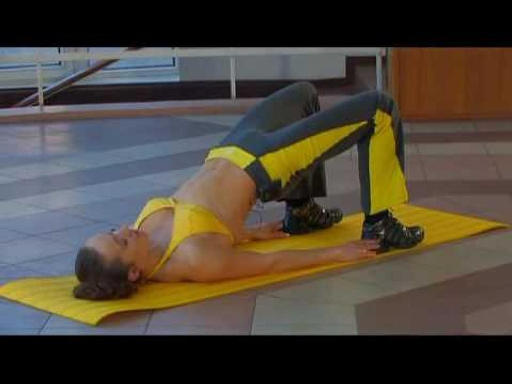

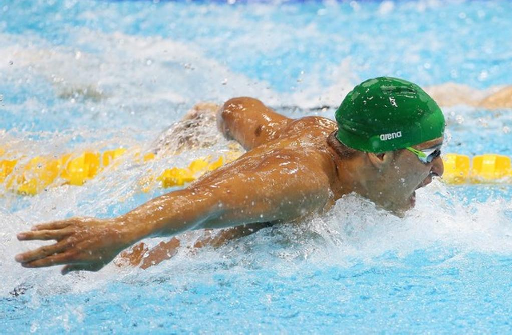

In [45]:
# create standard annotations for validation data
dataset_dicts = create_annotation(val_df)

# randomly select images
for d in random.sample(dataset_dicts,3):    
    
    # read an image
    im = cv2.imread(d["file_name"])
    
    # make predictions
    outputs = predictor(im)
    
    # create visualizer
    v = Visualizer(im[:, :, ::-1], metadata=face_metadata, scale=0.5)
    
    # draw predictions on the image
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    
    # display image
    cv2_imshow(v.get_image()[:, :, ::-1])

In [46]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

# create a evaluator using COCO metrics
evaluator = COCOEvaluator("face_val", cfg, False, output_dir="./output/")

# create a loader for test data
val_loader = build_detection_test_loader(cfg, "face_val")

# runs the model on each image in the test data and produces the results
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [02/02 15:13:49 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[02/02 15:13:49 d2.evaluation.coco_evaluation]: Trying to convert 'face_val' to COCO format ...
[02/02 15:13:49 d2.data.datasets.coco]: Converting annotations of dataset 'face_val' to COCO format ...)
[02/02 15:13:52 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[02/02 15:13:52 d2.data.datasets.coco]: Conversion finished, #images: 274, #annotations: 274
[02/02 15:13:52 d2.data.datasets.coco]: Caching COCO format annotations at './output/face_val_coco_format.json' ...
[02/02 15:13:55 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|    face    | 274          |
|            |              |
[02/02 15:13:55 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 80

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[02/02 15:13:57 d2.evaluation.evaluator]: Inference done 11/274. Dataloading: 0.0017 s/iter. Inference: 0.1198 s/iter. Eval: 0.0003 s/iter. Total: 0.1218 s/iter. ETA=0:00:32
[02/02 15:14:02 d2.evaluation.evaluator]: Inference done 52/274. Dataloading: 0.0028 s/iter. Inference: 0.1191 s/iter. Eval: 0.0003 s/iter. Total: 0.1224 s/iter. ETA=0:00:27
[02/02 15:14:07 d2.evaluation.evaluator]: Inference done 94/274. Dataloading: 0.0027 s/iter. Inference: 0.1180 s/iter. Eval: 0.0003 s/iter. Total: 0.1211 s/iter. ETA=0:00:21
[02/02 15:14:12 d2.evaluation.evaluator]: Inference done 135/274. Dataloading: 0.0028 s/iter. Inference: 0.1188 s/iter. Eval: 0.0003 s/iter. Total: 0.1221 s/iter. ETA=0:00:16
[02/02 15:14:17 d2.evaluation.evaluator]: Inference done 176/274. Dataloading: 0.0027 s/iter. Inference: 0.1192 s/iter. Eval: 0.0003 s/iter. Total: 0.1222 s/iter. ETA=0:00:11
[02/02 15:14:22 d2.evaluation.evaluator]: Inference done 216/274. Dataloading: 0.0026 s/iter. Inference: 0.1199 s/iter. Eval: 0.

OrderedDict([('bbox',
              {'AP': 57.088018724880754,
               'AP50': 95.07342015692872,
               'AP75': 61.81209764326567,
               'APs': 43.13861386138614,
               'APm': 43.55525252137167,
               'APl': 60.63079882010706})])